<a href="https://colab.research.google.com/github/Rishikakumari2000/Python-for-everybody/blob/main/Molecular_Dynamic_Simulation_of_Amylin_in_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**AIM**
To perform MD simulation of Amylin(5MGQ)

#**METHOD**

<figure>
<center>
<img src='https://raw.githubusercontent.com/pb3lab/ibm3202/master/images/MD_02.jpg' />
<figcaption>FIGURE 2. General steps for performing MD simulations. Starting from a experimental or modelled protein structure, a simulation system is prepared by setting up a simulation box, solvating the protein with water and neutralizing the total charge of the system with counterions. Then, the simulations are performed, visualized and analyzed in terms of their protein motions and energetic features<br>Morgnanesi D et al (2015) <i>Antiviral Res 123, 204-215</i></figcaption></center>
</figure>

#**PROCEDURE**

1. setting up GROMACS for preparing our MD system and performing our MD simulations.

In [ ]:
# Download and unzip the compressed folder of GROMACS 2020.6 version
!wget https://raw.githubusercontent.com/pb3lab/ibm3202/master/software/gromacs.tar.gz
!tar xzf gromacs.tar.gz

--2023-08-10 08:12:28--  https://raw.githubusercontent.com/pb3lab/ibm3202/master/software/gromacs.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35608971 (34M) [application/octet-stream]
Saving to: ‘gromacs.tar.gz’

gromacs.tar.gz      100%[===================>]  33.96M  --.-KB/s    in 0.1s    

2023-08-10 08:12:29 (237 MB/s) - ‘gromacs.tar.gz’ saved [35608971/35608971]



In [ ]:
# It is recommended (and required for GROMACS 2021) to upgrade cmake
!pip install cmake --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.0/26.0 MB 18.8 MB/s eta 0:00:00
  Attempting uninstall: cmake
    Found existing installation: cmake 3.25.2
    Uninstalling cmake-3.25.2:
      Successfully uninstalled cmake-3.25.2


In [ ]:
# If get : gmx: error while loading shared libraries: libhwloc.so.5: cannot open shared object file: No such file or directory
!wget https://download.open-mpi.org/release/hwloc/v1.11/hwloc-1.11.13.tar.gz


!tar xzf hwloc-1.11.13.tar.gz
!cd /content/hwloc-1.11.13
! /content/hwloc-1.11.13/configure
!make
!sudo make install

--2023-08-10 08:12:51--  https://download.open-mpi.org/release/hwloc/v1.11/hwloc-1.11.13.tar.gz
Resolving download.open-mpi.org (download.open-mpi.org)... 18.65.229.58, 18.65.229.5, 18.65.229.94, ...
Connecting to download.open-mpi.org (download.open-mpi.org)|18.65.229.58|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4487770 (4.3M) [binary/octet-stream]
Saving to: ‘hwloc-1.11.13.tar.gz’

hwloc-1.11.13.tar.g 100%[===================>]   4.28M  --.-KB/s    in 0.1s    

2023-08-10 08:12:52 (34.7 MB/s) - ‘hwloc-1.11.13.tar.gz’ saved [4487770/4487770]


###
### Configuring hwloc distribution tarball
### Startup tests
###
checking build system type... x86_64-unknown-linux-gnu
checking host system type... x86_64-unknown-linux-gnu
checking target system type... x86_64-unknown-linux-gnu
checking for a BSD-compatible install... /usr/bin/install -c
checking whether build environment is sane... yes
checking for a thread-safe mkdir -p... /usr/bin/mkdir -p
checking for ga

In [ ]:
#Check if GROMACS works
%%bash
source /content/gromacs/bin/GMXRC
gmx -h

SYNOPSIS

gmx [-[no]h] [-[no]quiet] [-[no]version] [-[no]copyright] [-nice <int>]
    [-[no]backup]

OPTIONS

Other options:

 -[no]h                     (no)
           Print help and quit
 -[no]quiet                 (no)
           Do not print common startup info or quotes
 -[no]version               (no)
           Print extended version information and quit
 -[no]copyright             (yes)
           Print copyright information on startup
 -nice   <int>              (19)
           Set the nicelevel (default depends on command)
 -[no]backup                (yes)
           Write backups if output files exist

Additional help is available on the following topics:
    commands    List of available commands
    selections  Selection syntax and usage
To access the help, use 'gmx help <topic>'.
For help on a command, use 'gmx help <command>'.


                         :-) GROMACS - gmx, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
        M

2. install py3Dmol to visualise protein

In [ ]:
!pip install py3Dmol
import py3Dmol

3. install biopython for manipulating PDB

In [ ]:
!pip install biopython

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 14.1 MB/s eta 0:00:00


4. Setting up MD Simulation

In [ ]:
#constantly it is needed to source GMXRC for GROMACS to work
%%bash
source /content/gromacs/bin/GMXRC


In [ ]:
#Let's make a folder first. We need to import the os and path library
import os
from pathlib import Path
#Then, we define the path of the folder we want to create.
#Notice that the HOME folder for a hosted runtime in colab is /content/
mdpath = Path("/content/simulation/")
#os.mkdir(mdpath)
#Now, we create the folder using the os.mkdir() command
#The if conditional is just to check whether the folder already exists
#In which case, python returns an error
if os.path.exists(mdpath):
  print("path already exists")
if not os.path.exists(mdpath):
  os.mkdir(mdpath)
  print("path was succesfully created")

path was succesfully created


In [ ]:
#First, we will change to the new folder. We will use python now :)
os.chdir(mdpath)

In [ ]:
from google.colab import files
files.upload()

Saving step4_lipid.pdb to step4_lipid.pdb


{'step4_lipid.pdb': b"REMARK  GENERATED BY CHARMM-GUI (HTTP://WWW.CHARMM-GUI.ORG) V3.7 ON AUG, 10. 2023. JOB\nREMARK  REPLACE PACKED BIG SPHERES BY LIPID MOLECULES OF RANDOM CONFORMATION          \nREMARK   DATE:     8/10/23      2:18:10      CREATED BY USER: apache                  \nATOM      1  C3  CHL1    1       0.079  -0.344  17.288  1.00  0.00      MEMB\nATOM      2  H3  CHL1    1      -0.994  -0.309  17.003  1.00  0.00      MEMB\nATOM      3  O3  CHL1    1       0.107  -0.421  18.712  1.00  0.00      MEMB\nATOM      4  H3' CHL1    1      -0.777  -0.755  18.880  1.00  0.00      MEMB\nATOM      5  C4  CHL1    1       0.665  -1.600  16.683  1.00  0.00      MEMB\nATOM      6  H4A CHL1    1       1.728  -1.726  16.978  1.00  0.00      MEMB\nATOM      7  H4B CHL1    1       0.044  -2.397  17.146  1.00  0.00      MEMB\nATOM      8  C5  CHL1    1       0.548  -1.556  15.175  1.00  0.00      MEMB\nATOM      9  C6  CHL1    1      -0.208  -2.427  14.481  1.00  0.00      MEMB\nATOM     10 

Protein Preparation

In [ ]:
#Importing your PDB file using biopython
import os
from Bio.PDB import *
pdbid = ['5mgq']
pdbl = PDBList()
for s in pdbid:
  pdbl.retrieve_pdb_file(s, pdir='.', file_format ="pdb", overwrite=True)
  os.rename("pdb"+s+".ent", s+".pdb")

In [ ]:
#Here we set up a parser for our PDB
parser = PDBParser()
io=PDBIO()
structure = parser.get_structure('X', '5mgq.pdb')
#And here we remove hydrogens, waters and ligands using Dice
io.set_structure(structure)
sel = Dice.ChainSelector( 'A',1, 5000)
io.save("5mgq_clean.pdb", sel)
print("Your PDB was processed. Only the protein heavy atoms have been kept!")
# !grep -v "HOH" 6WZU_ready.pdb > 6WZU_clean.pdb , to remove only water

Your PDB was processed. Only the protein heavy atoms have been kept!


In [ ]:
#First we assign the py3Dmol.view as view
view=py3Dmol.view()
#The following lines are used to add the addModel class
#to read the PDB files
view.addModel(open('step4_lipid.pdb', 'r').read())
#Here we set the background color as white
view.setBackgroundColor('black')
#Here we set the visualization style and color
view.setStyle({'chain': 'A'},{'cartoon': {'color':'spectrum'}})
#Centering view on all visible atoms
view.zoomTo()
#And we finally visualize the structures using the command below
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
!pip install nglview

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 13.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 40.3 MB/s eta 0:00:00
  Created wheel for nglview: filename=nglview-3.0.6-py3-none-any.whl size=10096109 sha256=e0d01cf391d2f2d6d4df35020fa986171199d28241fdae461012c9aca3db0292
  Stored in directory: /root/.cache/pip/wheels/48/56/11/f23486e3ce7371bd7e216b0e1643057a435ecfc413666020a4
Successfully built nglview


In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
import nglview as ng
view = ng.show_structure_file("step4_lipid.pdb")
view

NGLWidget()

In [ ]:
%%bash
source /content/gromacs/bin/GMXRC
gmx pdb2gmx -f step4_lipid.pdb -o lipid_bilayer_processed.gro -ignh -ter -water spc

In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#Using pdb2gmx to parameterize our PDB with the AMBER forcefield and SPC/E water
#The topology file receives a default topol.top name, although this can be altered with the -p option.
'''When working with NMR files, it is useful to incorporate the -ignh option, that allows to ignore hydrogens contained in the PDB file.
'''During parameterization, hydrogens are always added back by the force field, as it contains the typical distance parameters for all atoms
'''based on experimental/quantum mechanics analysis.'''

gmx pdb2gmx -f lipid_bilayer.pdb -o 5mgq_processed.pdb -water spce -ignh

What is Generating?

A .gro or .pdb coordinate file that contains all the atom types as defined by a given force field (including hydrogens).
A .top topology file containing the parameters for bonds, angles, dihedrals and non-bonded interactions defined by a given force field (potential energy function) to employ in our simulations.

We will parameterize our protein using the **AMBER99SB-ILDN** force field on GROMACS and obtain these files using gmx.


In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#Using editconf to create a cubic box with 1.0 nm padding for our solvated system
gmx editconf -f 5mgq_processed.pdb -o 5mgq_newbox.pdb -c -d 1.0 -bt cubic

In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#Using solvate to fill up our box with water molecules
gmx solvate -cp 5mgq_newbox.pdb -o 5mgq_solv.pdb -p topol.top


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary.

NOTE: From version 5.0 gmx solvate uses the Van der Waals radii
from the source below. This means the results may be different
compared to previous GROMACS versions.

++++ PLEASE READ AND CITE THE FOLLOWING REFERENCE ++++
A. Bondi
van der Waals Volumes and Radii
J. Phys. Chem. 68 (1964) pp. 441-451
-------- -------- --- Thank You --- -------- --------

Adding line for 6652 solvent molecules with resname (SOL) to topology file (topol.top)


                     :-) GROMACS - gmx solvate, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
     

In [ ]:
#First we assign the py3Dmol.view as view
view=py3Dmol.view()
#The following lines are used to add the addModel class
#to read the PDB files
view.addModel(open('5mgq_solv.pdb', 'r').read(),'pdb')
#Here we set the background color as white
view.setBackgroundColor('white')
#Here we set the visualization style and color
view.setStyle({'cartoon': {'color':'green'}})
#Here we add a style for showing the oxygen from water molecules
view.addStyle({'atom':'OW'},{'sphere':{'radius':'0.2'}})
#Centering the view on all visible atoms
view.zoomTo()
#And we finally visualize the structures using the command below
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
!grep "qtot" topol.top

    24          O      1    LYS      O     24    -0.6013         16   ; qtot 2
    34          O      2    CYS      O     34    -0.5679         16   ; qtot 2
    48          O      3    ASN      O     48    -0.5679         16   ; qtot 2
    62          O      4    THR      O     62    -0.5679         16   ; qtot 2
    72          O      5    ALA      O     72    -0.5679         16   ; qtot 2
    86          O      6    THR      O     86    -0.5679         16   ; qtot 2
    96          O      7    CYS      O     96    -0.5679         16   ; qtot 2
   106          O      8    ALA      O    106    -0.5679         16   ; qtot 2
   120          O      9    THR      O    120    -0.5679         16   ; qtot 2
   137          O     10    GLN      O    137    -0.5679         16   ; qtot 2
   161          O     11    ARG      O    161    -0.5894         16   ; qtot 3
   180          O     12    LEU      O    180    -0.5679         16   ; qtot 3
   190          O     13    ALA      O    190    -0.

In [ ]:
%%bash
wget https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/ions.mdp
source /content/gromacs/bin/GMXRC

#Using grompp and an MD instruction file to add counterions to our system
gmx grompp -f ions.mdp -c 5mgq_solv.pdb -p topol.top -o ions.tpr

Analysing residue names:
There are:    36    Protein residues
There are:  6652      Water residues
Analysing Protein...
This run will generate roughly 2 Mb of data


--2023-07-05 05:43:16--  https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/ions.mdp
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 966 [text/plain]
Saving to: ‘ions.mdp.2’

     0K                                                       100% 66.1M=0s

2023-07-05 05:43:17 (66.1 MB/s) - ‘ions.mdp.2’ saved [966/966]

                      :-) GROMACS - gmx grompp, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov  

In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#This is a trick to provide interactive options to gmx
echo "SOL" > options
echo " " >> options

#Using genion and the tpr to add counterions to our solvated system
gmx genion -s ions.tpr -o 6wzu_solv_ions.pdb -p topol.top -pname NA -nname CL -neutral < options

Will try to add 0 NA ions and 2 CL ions.
Select a continuous group of solvent molecules
Selected 13: 'SOL'

Processing topology
Replacing 2 solute molecules in topology file (topol.top)  by 0 NA and 2 CL ions.


                      :-) GROMACS - gmx genion, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
     

#**MINIMISATION**

In [ ]:
#download MD instruction file
!wget https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/em.mdp


--2023-07-05 05:43:24--  https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/em.mdp
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1167 (1.1K) [text/plain]
Saving to: ‘em.mdp.2’

em.mdp.2            100%[===================>]   1.14K  --.-KB/s    in 0s      

2023-07-05 05:43:24 (73.2 MB/s) - ‘em.mdp.2’ saved [1167/1167]



In [ ]:
#Check the content of the MDP file
!paste em.mdp

; em.mdp - used as input into grompp to generate em.tpr
; Parameters describing what to do, when to stop and what to save
integrator  = steep         ; Algorithm (steep = steepest descent minimization)
emtol       = 1000.0        ; Stop minimization when the maximum force < 1000.0 kJ/mol/nm
emstep      = 0.001         ; Minimization step size
nsteps      = 50000         ; Maximum number of (minimization) steps to perform

; Parameters describing how to find the neighbors of each atom and how to calculate the interactions
nstlist         = 1         ; Frequency to update the neighbor list and long range forces
cutoff-scheme   = Verlet    ; Buffered neighbor searching
rcoulomb        = 1.2       ; Short-range electrostatic cut-off
rvdw            = 1.2       ; Short-range Van der Waals cut-off
pbc             = xyz       ; Periodic Boundary Conditions in all 3 dimensions

; Electrostatics
coulombtype     = PME       ; Particle Mesh Ewald for long-range electrostatics
pme_order       = 4 

In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#Using grompp to prepare our minimization MD
gmx grompp -f em.mdp -c 6wzu_solv_ions.pdb -p topol.top -o em.tpr

#Run our minimization
gmx mdrun -v -deffnm em -nb gpu

Analysing residue names:
There are:    36    Protein residues
There are:  6650      Water residues
There are:     2        Ion residues
Analysing Protein...
Analysing residues not classified as Protein/DNA/RNA/Water and splitting into groups...
Calculating fourier grid dimensions for X Y Z
Using a fourier grid of 40x40x40, spacing 0.148 0.148 0.148
This run will generate roughly 2 Mb of data


                      :-) GROMACS - gmx grompp, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
     

In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#This is a trick to provide interactive options to gmx
echo "Potential" > options
echo " " >> options

#Using energy to extract the potential energy of the system
gmx energy -f em.edr -o em_potential.xvg -xvg none < options


Statistics over 565 steps [ 0.0000 through 564.0000 ps ], 1 data sets
All statistics are over 450 points (frames)

Energy                      Average   Err.Est.       RMSD  Tot-Drift
-------------------------------------------------------------------------------
Potential                   -336560       9000    26776.1   -58744.1  (kJ/mol)


                      :-) GROMACS - gmx energy, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
     

<ipython-input-110-406c7f9fca4c>:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


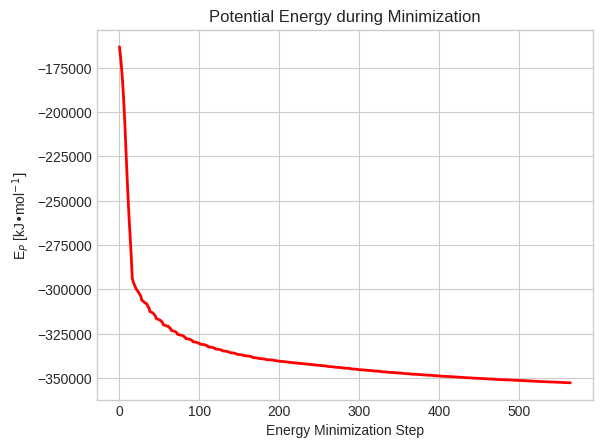

In [ ]:
#Plotting the potential energy of the system
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np

#Reading the text file containing this information
data = np.loadtxt('em_potential.xvg')

plt.title('Potential Energy during Minimization')
plt.xlabel('Energy Minimization Step')
plt.ylabel(r'E$_P$ [kJ•mol$^{-1}]$')
plt.plot(data[:,0], data[:,1], linestyle='solid', linewidth='2', color='red')
plt.show()

 how the potential energy of the system changes over each minimization step

#**Equilibration**

This step is required given that we optimized the positions of the atoms according to our force field, but at no point we maximized the interactions between solvent and solute. We also have not established the kinetic effect of temperature on atom motions or the pressure of our system, thus making it unrelatable to experimental conditions.

Thus, we will equilibrate the energy and density of our system at constant temperature and pressure before the MD production runs.

In [ ]:
%%bash
wget https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/nvt.mdp
#Using grompp to prepare our NVT equilibration MD
source /content/gromacs/bin/GMXRC
gmx grompp -f nvt.mdp -c em.gro -r em.gro -p topol.top -o nvt.tpr



turning H bonds into constraints...
turning H bonds into constraints...
turning H bonds into constraints...
Analysing residue names:
There are:    36    Protein residues
There are:  6650      Water residues
There are:     2        Ion residues
Analysing Protein...
Analysing residues not classified as Protein/DNA/RNA/Water and splitting into groups...
Determining Verlet buffer for a tolerance of 0.005 kJ/mol/ps at 300 K
Calculated rlist for 1x1 atom pair-list as 1.297 nm, buffer size 0.097 nm
Set rlist, assuming 4x4 atom pair-list, to 1.225 nm, buffer size 0.025 nm
Note that mdrun will redetermine rlist based on the actual pair-list setup
Calculating fourier grid dimensions for X Y Z
Using a fourier grid of 40x40x40, spacing 0.148 0.148 0.148
This run will generate roughly 12 Mb of data


--2023-07-05 05:44:46--  https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/nvt.mdp
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2464 (2.4K) [text/plain]
Saving to: ‘nvt.mdp.10’

     0K ..                                                    100% 29.0M=0s

2023-07-05 05:44:46 (29.0 MB/s) - ‘nvt.mdp.10’ saved [2464/2464]

                      :-) GROMACS - gmx grompp, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei 

In [ ]:
%%time
%%bash
#Run our NVT equilibration MD
source /content/gromacs/bin/GMXRC
gmx mdrun -deffnm nvt -nb gpu

                      :-) GROMACS - gmx mdrun, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
      

CPU times: user 229 ms, sys: 18.4 ms, total: 248 ms
Wall time: 54.5 s


In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#This is a trick to provide interactive options to gmx
echo "Temperature" > options
echo " " >> options

#Using energy to extract the temperature of the system during the NVT equil MD
gmx energy -f nvt.edr -o nvt_temp.xvg -xvg none < options


Statistics over 50001 steps [ 0.0000 through 100.0000 ps ], 1 data sets
All statistics are over 501 points

Energy                      Average   Err.Est.       RMSD  Tot-Drift
-------------------------------------------------------------------------------
Temperature                  299.79       0.18    3.32627   0.858016  (K)


                      :-) GROMACS - gmx energy, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
     

<ipython-input-116-a55245991303>:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


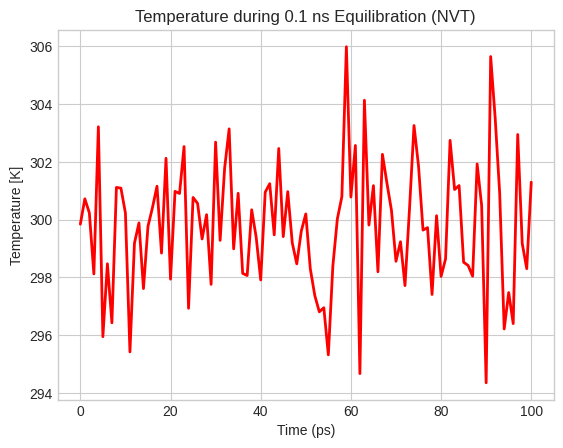

In [ ]:
#Plotting the temperature of the system
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np

#Reading the text file containing this information
data = np.loadtxt('nvt_temp.xvg')

plt.title('Temperature during 0.1 ns Equilibration (NVT)')
plt.xlabel('Time (ps)')
plt.ylabel('Temperature [K]')
plt.plot(data[:,0], data[:,1], linestyle='solid', linewidth='2', color='red')
plt.show()

In [ ]:
%%bash
wget https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/npt.mdp

#Using grompp to prepare our NPT equilibration MD
source /content/gromacs/bin/GMXRC
gmx grompp -f npt.mdp -c nvt.gro -r nvt.gro -t nvt.cpt -p topol.top -o npt.tpr

turning H bonds into constraints...
turning H bonds into constraints...
turning H bonds into constraints...
Analysing residue names:
There are:    36    Protein residues
There are:  6650      Water residues
There are:     2        Ion residues
Analysing Protein...
Analysing residues not classified as Protein/DNA/RNA/Water and splitting into groups...
Determining Verlet buffer for a tolerance of 0.005 kJ/mol/ps at 300 K
Calculated rlist for 1x1 atom pair-list as 1.297 nm, buffer size 0.097 nm
Set rlist, assuming 4x4 atom pair-list, to 1.225 nm, buffer size 0.025 nm
Note that mdrun will redetermine rlist based on the actual pair-list setup
Calculating fourier grid dimensions for X Y Z
Using a fourier grid of 40x40x40, spacing 0.148 0.148 0.148
This run will generate roughly 12 Mb of data


--2023-07-05 05:47:25--  https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/npt.mdp
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2687 (2.6K) [text/plain]
Saving to: ‘npt.mdp’

     0K ..                                                    100% 35.4M=0s

2023-07-05 05:47:25 (35.4 MB/s) - ‘npt.mdp’ saved [2687/2687]

                      :-) GROMACS - gmx grompp, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupino

In [ ]:
%%time
%%bash
#Run our NPT equilibration MD
source /content/gromacs/bin/GMXRC
gmx mdrun -deffnm npt -nb gpu

                      :-) GROMACS - gmx mdrun, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
      

CPU times: user 276 ms, sys: 26.6 ms, total: 303 ms
Wall time: 1min 7s


In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#This is a trick to provide interactive options to gmx
echo "Pressure" > options
echo "Density" >> options
echo " "

#Using energy to extract the pressure and density of the system during the NPT equil MD
gmx energy -f npt.edr -o npt_press_dens.xvg -xvg none < options

 

Statistics over 50001 steps [ 0.0000 through 100.0000 ps ], 2 data sets
All statistics are over 501 points

Energy                      Average   Err.Est.       RMSD  Tot-Drift
-------------------------------------------------------------------------------
Pressure                    -2.8144        7.7    194.963    1.02844  (bar)
Density                      1006.9       0.59    3.54569     2.8758  (kg/m^3)


                      :-) GROMACS - gmx energy, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
     

<ipython-input-120-5147c13e460a>:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


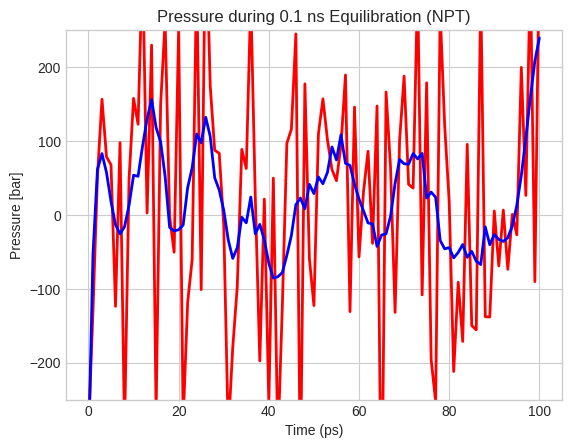

In [ ]:
#Plotting the density of the system
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np

#Reading the text file containing this information
data = np.loadtxt('npt_press_dens.xvg')

plt.title('Pressure during 0.1 ns Equilibration (NPT)')
plt.xlabel('Time (ps)')
plt.ylabel('Pressure [bar]')
plt.ylim(-250,250)

#Smoothing using Savitzky-Golay
from scipy.signal import savgol_filter
yhat = savgol_filter(data[:,1], 21, 5)

#Plot raw data and spline interpolation
plt.plot(data[:,0], data[:,1], linestyle='solid', linewidth='2', color='red')
plt.plot(data[:,0], yhat, linestyle='solid', linewidth='2', color='blue')
plt.show()

<ipython-input-121-a02935576ad6>:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


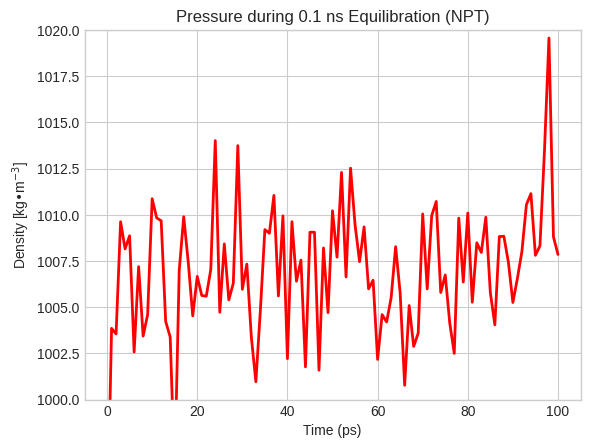

In [ ]:
#Plotting the pressure of the system
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np

#Reading the text file containing this information
data = np.loadtxt('npt_press_dens.xvg')

plt.title('Pressure during 0.1 ns Equilibration (NPT)')
plt.xlabel('Time (ps)')
plt.ylabel('Density [kg•m$^{-3}$]')
plt.ylim(1000,1020)
plt.plot(data[:,0], data[:,2], linestyle='solid', linewidth='2', color='red')
plt.show()

#**PRODUCTION**

In [ ]:
%%bash
wget https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/md.mdp

#Using grompp to prepare our production MD
source /content/gromacs/bin/GMXRC
gmx grompp -f md.mdp -c npt.gro -t npt.cpt -p topol.top -o md_1.tpr

turning H bonds into constraints...
turning H bonds into constraints...
turning H bonds into constraints...
Analysing residue names:
There are:    36    Protein residues
There are:  6650      Water residues
There are:     2        Ion residues
Analysing Protein...
Analysing residues not classified as Protein/DNA/RNA/Water and splitting into groups...
Determining Verlet buffer for a tolerance of 0.005 kJ/mol/ps at 300 K
Calculated rlist for 1x1 atom pair-list as 1.298 nm, buffer size 0.098 nm
Set rlist, assuming 4x4 atom pair-list, to 1.226 nm, buffer size 0.026 nm
Note that mdrun will redetermine rlist based on the actual pair-list setup
Calculating fourier grid dimensions for X Y Z
Using a fourier grid of 40x40x40, spacing 0.147 0.147 0.147
This run will generate roughly 7 Mb of data


--2023-07-05 05:52:27--  https://raw.githubusercontent.com/pb3lab/ibm3202/master/files/md.mdp
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2619 (2.6K) [text/plain]
Saving to: ‘md.mdp’

     0K ..                                                    100% 37.7M=0s

2023-07-05 05:52:28 (37.7 MB/s) - ‘md.mdp’ saved [2619/2619]

                      :-) GROMACS - gmx grompp, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov  

In [ ]:
#Check the content of the production MD file
!paste md.mdp

; Run parameters
integrator              = md        ; leap-frog integrator
nsteps                  = 50000    ; 2 * 50000 = 100 ps (0.1 ns)
dt                      = 0.002     ; 2 fs

; Output control
nstxout                 = 0         ; suppress bulky .trr file by specifying 
nstvout                 = 0         ; 0 for output frequency of nstxout,
nstfout                 = 0         ; nstvout, and nstfout
nstenergy               = 1000      ; save energies every 2.0 ps
nstlog                  = 1000      ; update log file every 2.0 ps
nstxout-compressed      = 1000      ; save compressed coordinates every 2.0 ps
compressed-x-grps       = System    ; save the whole system

; Bond parameters
continuation            = yes       ; Restarting after NPT 
constraint_algorithm    = lincs     ; holonomic constraints 
constraints             = h-bonds   ; bonds involving H are constrained
lincs_iter              = 1         ; accuracy of LINCS
lincs_order             = 4         ; also relate

In [ ]:
%%time
%%bash
#Run our production MD
source /content/gromacs/bin/GMXRC
gmx mdrun -deffnm md_1 -nb gpu

                      :-) GROMACS - gmx mdrun, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
      

CPU times: user 287 ms, sys: 34.9 ms, total: 322 ms
Wall time: 1min 14s


In [ ]:
%%bash
source /content/gromacs/bin/GMXRC

#This is a trick to provide interactive options to gmx
echo "Protein" > options
echo "Protein" >> options
echo " "

#Using trjconv to extract only the protein atoms from the simulation trajectory
#and also recenter the protein if its atoms crossed the periodic boundaries
gmx trjconv -s md_1.tpr -f md_1.xtc -o md_1_protPBC.pdb -pbc mol -center < options

 
Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


                     :-) GROMACS - gmx trjconv, 2020.6 (-:

                            GROMACS is written by:
     Emile Apol      Rossen Apostolov      Paul Bauer     Herman J.C. Berendsen
    Par Bjelkmar      Christian Blau   Viacheslav Bolnykh     Kevin Boyd    
 Aldert van Buuren   Rudi van Drunen     Anton Feenstra       Alan Gray     
  Gerrit Groenhof     Anca Hamuraru    Vincent Hindriksen  M. Eric Irrgang  
  Aleksei Iupinov   Christoph Junghans     Joe Jordan     Dimitrios Karkoulis
    Peter Kasson        Jiri Kraus      Carsten Kutzner      Per Larsson    
  Justin A. Lemkul    Viveca Lindahl    Magnus Lundborg     Erik Marklund   
    Pascal Merz     Pieter Meulenhoff    Teemu Murtola       Szilard Pall   
    Sander Pronk      Roland Schulz      Michael Shirts    Alexey Shvetsov  
   Alfons Sijbers     Peter Tieleman      Jon Vincent      Teemu Virolainen 
 Christian Wennberg    Maarten Wolf      Artem Zhmurov   
                           and the project leaders:
     

In [ ]:
os.chdir("/content/")
!zip -r md.zip $mdpath
from google.colab import files
files.download("/content/md.zip")
os.chdir(mdpath)

  adding: content/md01/ (stored 0%)
  adding: content/md01/contrib/ (stored 0%)
  adding: content/md01/contrib/systemd/ (stored 0%)
  adding: content/md01/contrib/systemd/hwloc-dump-hwdata.service (deflated 42%)
  adding: content/md01/contrib/systemd/Makefile (deflated 67%)
  adding: content/md01/mdout.mdp (deflated 62%)
  adding: content/md01/hwloc-1.11.13.tar.gz.1 (deflated 0%)
  adding: content/md01/nvt.cpt (deflated 9%)
  adding: content/md01/nvt.mdp (deflated 60%)
  adding: content/md01/em_potential.xvg (deflated 76%)
  adding: content/md01/ions.tpr (deflated 77%)
  adding: content/md01/#em.edr.1# (deflated 43%)
  adding: content/md01/#6wzu_solv_ions.pdb.2# (deflated 82%)
  adding: content/md01/ions.mdp.1 (deflated 52%)
  adding: content/md01/nvt.mdp.2 (deflated 60%)
  adding: content/md01/nvt.edr (deflated 24%)
  adding: content/md01/6wzu_solv_ions.pdb (deflated 82%)
  adding: content/md01/#posre.itp.3# (deflated 89%)
  adding: content/md01/npt.xtc (deflated 0%)
  adding: content

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>